<a href="https://colab.research.google.com/github/Akankshaaaa/dogBreedClassification/blob/main/dog_breed_explainable.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dog Breed Classification
The aim is to classify similar looking terrier type of dogs. We focus on 5 terrier dog breeds viz. 

*   Australian Terrier
*   Cairn Terrier
*   Norfolk Terrier
*   Norwich Terrier
*   Silky Terrier

The classification output is then explained with LIME in order to better understand the prediction of the model.





In [ ]:
# imports

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from numpy.random import permutation
from mpl_toolkits.axes_grid1 import ImageGrid
from keras.preprocessing.image import array_to_img, img_to_array,load_img,ImageDataGenerator
import tensorflow as tf
from tensorflow.keras import Model, Input, regularizers
import skimage
from skimage import io
from sklearn.model_selection import train_test_split
import matplotlib.image as mpimg
from skimage.segmentation import mark_boundaries
from keras.layers import *
from keras.models import Sequential
from keras.preprocessing import image
from tensorflow.keras import applications
from tensorflow.keras.layers import Dense, Flatten, Dropout, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.utils import to_categorical, model_to_dot, plot_model
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, CSVLogger, ReduceLROnPlateau
import json
import random
import tensorflow
import os
%pip install lime
import lime
from lime import lime_image

     |████████████████████████████████| 275 kB 5.0 MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=8ebe3d142eb0dba73b5c2911aaae3f8fa58cfe95d8bbbb6182ed52b72d8b2e07
  Stored in directory: /root/.cache/pip/wheels/ca/cb/e5/ac701e12d365a08917bf4c6171c0961bc880a8181359c66aa7
Successfully built lime


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Data preprocessing

In [ ]:
batch_size = 64


In [ ]:
train_path = '/content/drive/MyDrive/dogBreed/dogs_dataset'

In [ ]:
# normalizing and data augmentation, if needed
train_datagen = ImageDataGenerator(rescale= 1./255,
                                   shear_range= 0.2,
                                   zoom_range= 0.2,
                                   horizontal_flip= True,
                                   rotation_range= 20,
                                   width_shift_range= 0.2,
                                   height_shift_range= 0.2,   
                                   validation_split=0.2)

valid_datagen = ImageDataGenerator(rescale= 1./255, 
                                   validation_split=0.2)

In [ ]:
train_generator = train_datagen.flow_from_directory(train_path,  
                                                    target_size= (224, 224), 
                                                    color_mode= 'rgb',
                                                    batch_size= batch_size,  
                                                    class_mode= 'categorical',
                                                    subset='training',
                                                    shuffle= True, 
                                                    seed= 1337) 

valid_generator = valid_datagen.flow_from_directory(train_path,
                                                    target_size= (224, 224),
                                                    color_mode= 'rgb',
                                                    batch_size= batch_size,  
                                                    class_mode= 'categorical',
                                                    subset='validation',
                                                    shuffle= True, 
                                                    seed= 1337)

Found 600 images belonging to 5 classes.
Found 150 images belonging to 5 classes.


In [ ]:
test_path = '/content/drive/MyDrive/dogBreed/test_dataset'

In [ ]:
#Normalize images
test_datagen = ImageDataGenerator(rescale=1. / 255)

#Resize images, if needed
test = test_datagen.flow_from_directory(test_path, 
                                          target_size=(224, 224), 
                                          color_mode="rgb",
                                          batch_size=32, 
                                          shuffle= False,
                                          class_mode='categorical')

Found 183 images belonging to 5 classes.


In [ ]:
num_classes = len(train_generator.class_indices)  
class_dict = {value : key for (key, value) in train_generator.class_indices.items()}
train_labels = train_generator.classes 
train_labels = to_categorical(train_labels, num_classes=num_classes)
valid_labels = valid_generator.classes 
valid_labels = to_categorical(valid_labels, num_classes=num_classes)
test_labels = test.classes 
test_labels = to_categorical(test_labels, num_classes=num_classes)
nb_train_samples = len(train_generator.filenames)  
nb_valid_samples = len(valid_generator.filenames)


In [ ]:
# list labels as key value pairs
classes = list(train_generator.class_indices.keys())
classes
class_dict

{0: 'australian_terrier',
 1: 'cairn_terrier',
 2: 'norfolk_terrier',
 3: 'norwich_terrier',
 4: 'silky_terrier'}

### Visualizing the Dataset

In [ ]:
def show_grid(image_list,nrows,ncols,label_list=None,show_labels=False,savename=None,figsize=(10,10),showaxis='off'):
    if type(image_list) is not list:
        if(image_list.shape[-1]==1):
            image_list = [image_list[i,:,:,0] for i in range(image_list.shape[0])]
        elif(image_list.shape[-1]==3):
            image_list = [image_list[i,:,:,:] for i in range(image_list.shape[0])]
    fig = plt.figure(None, figsize,frameon=False)
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                     nrows_ncols=(nrows, ncols),  # creates 2x2 grid of axes
                     axes_pad=0.3,  # pad between axes in inch.
                     share_all=True,
                     )
    for i in range(nrows*ncols):
        ax = grid[i]
        ax.imshow(image_list[i],cmap='Greys_r')  # The AxesGrid object work as a list of axes.
        ax.axis('off')
        if show_labels:
            ax.set_title(class_mapping[y_int[i]])
    if savename != None:
        plt.savefig(savename,bbox_inches='tight')

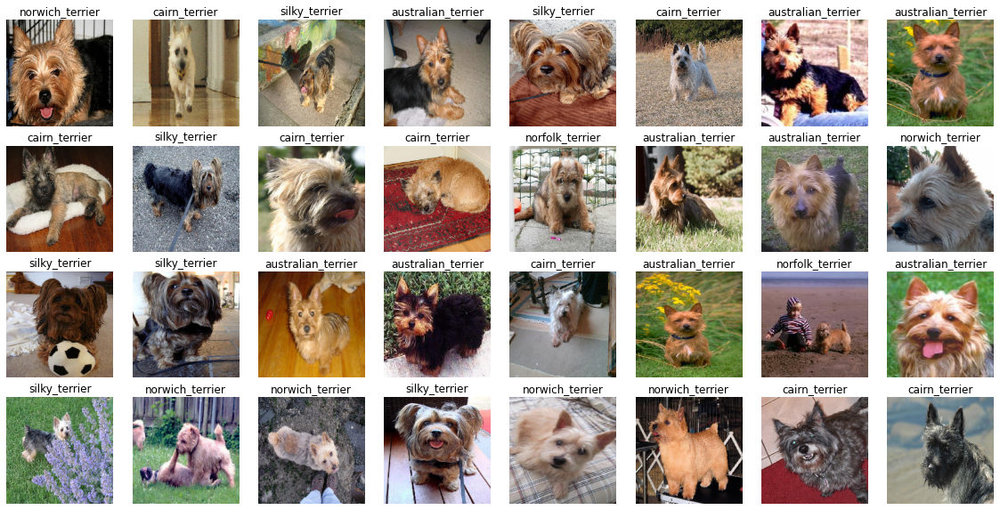

In [ ]:
class_mapping = {v:k for k,v in valid_generator.class_indices.items()}

x,y = next(valid_generator)
y_int = np.argmax(y,axis=-1)

show_grid(x,4,8,label_list=y_int,show_labels=True,figsize=(20,10))


## Model

### Model creation

In [ ]:
InceptionV3 = applications.InceptionV3(include_top= False, input_shape= (224, 224, 3), weights= 'imagenet')
InceptionV3.summary()


87924736/87910968 [==============================] - 1s 0us/step
Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)           

In [ ]:
model = Sequential()

for layer in InceptionV3.layers:
    layer.trainable= False
    
model.add(InceptionV3)
model.add(GlobalAveragePooling2D())
model.add(Dropout(0.2))
model.add(Dense(5,activation='softmax'))
model.summary()

model.compile(optimizer= tf.keras.optimizers.Adam(learning_rate= 0.0001), loss= 'categorical_crossentropy', metrics= ['accuracy'])


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_1 (Dropout)         (None, 2048)              0         
                                                                 
 dense_1 (Dense)             (None, 5)                 10245     
                                                                 
Total params: 21,813,029
Trainable params: 10,245
Non-trainable params: 21,802,784
_________________________________________________________________


### Training

Epoch 1/30
9/9 - 17s - loss: 2.0148 - accuracy: 0.2239 - val_loss: 1.7592 - val_accuracy: 0.2969 - 17s/epoch - 2s/step
Epoch 2/30
9/9 - 10s - loss: 1.7902 - accuracy: 0.2612 - val_loss: 1.5627 - val_accuracy: 0.3672 - 10s/epoch - 1s/step
Epoch 3/30
9/9 - 10s - loss: 1.6826 - accuracy: 0.3134 - val_loss: 1.4091 - val_accuracy: 0.4375 - 10s/epoch - 1s/step
Epoch 4/30
9/9 - 10s - loss: 1.5017 - accuracy: 0.3918 - val_loss: 1.3321 - val_accuracy: 0.4609 - 10s/epoch - 1s/step
Epoch 5/30
9/9 - 12s - loss: 1.4404 - accuracy: 0.4167 - val_loss: 1.1855 - val_accuracy: 0.5703 - 12s/epoch - 1s/step
Epoch 6/30
9/9 - 11s - loss: 1.3256 - accuracy: 0.4627 - val_loss: 1.0976 - val_accuracy: 0.6094 - 11s/epoch - 1s/step
Epoch 7/30
9/9 - 9s - loss: 1.2657 - accuracy: 0.4925 - val_loss: 1.0543 - val_accuracy: 0.6094 - 9s/epoch - 1s/step
Epoch 8/30
9/9 - 10s - loss: 1.1828 - accuracy: 0.5299 - val_loss: 0.9987 - val_accuracy: 0.6484 - 10s/epoch - 1s/step
Epoch 9/30
9/9 - 10s - loss: 1.1334 - accuracy: 0.

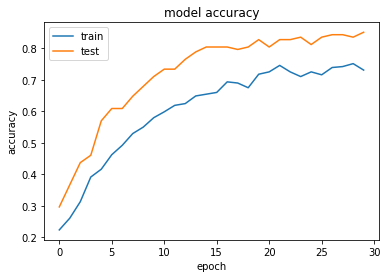

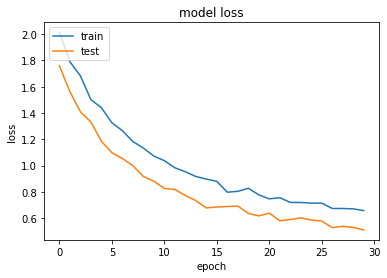

In [ ]:
earlystop = EarlyStopping(
    monitor='val_loss',
    min_delta=0.001,
    patience=4,
    verbose=1,
    mode='auto'
)

history = model.fit(
    train_generator, 
    epochs = 30,
    steps_per_epoch = nb_train_samples//batch_size,
    validation_data = valid_generator, 
    validation_steps = nb_valid_samples//batch_size,
    verbose = 2, 
    callbacks = earlystop,
    shuffle = True
)


model.save('/content/drive/MyDrive/dogBreed/models/dogs_classify_vx.model')


#plot epochs vs loss and accuracy graphs
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
#load previous model
model = tf.keras.models.load_model(
    '/content/drive/MyDrive/dogBreed/models/dogs_classify_v5.model',
    custom_objects=None,
    compile=True)

### Testing

In [ ]:
# evaluate modell on test data
print("Evaluate on test data")
scores = model.evaluate(test, verbose=1)
print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

Evaluate on test data
6/6 [==============================] - 54s 10s/step - loss: 0.6318 - accuracy: 0.7596
accuracy: 75.96%


In [ ]:

test_input = []
filepath = []
class_names = test.classes

for i in test.filepaths:
  img = skimage.io.imread(i)
  img = skimage.transform.resize(img, (224,224,3))
  img = image.img_to_array(img)
  test_input.append(img)
  filepath.append(i)

test_input = np.array(test_input)
filepath = np.array(filepath)

print(test_input.shape)

# randomizes test_input and stores corresponding labels in the same order
# perm = permutation(len(test_input))
# test_input = test_input[perm]
# class_names = class_names[perm]
# filepath = filepath[perm]


(183, 224, 224, 3)


#### Confusion Matrix

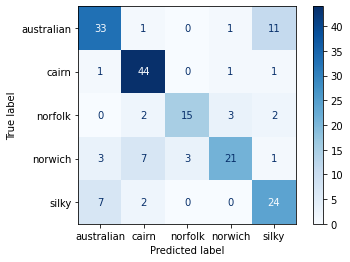

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import numpy as np

Y_pred = model.predict(test_input)
y_pred = np.argmax(Y_pred, axis=1)
y_test = np.array(class_names)
labels = ['australian', 'cairn', 'norfolk','norwich','silky']

cm = confusion_matrix(y_test, y_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)

disp.plot(cmap=plt.cm.Blues)
plt.show()

In [ ]:
# correct and incorrectly predicted results are stored in respective arrays
correct_predict = []
incorrect_predict = []
correct_label = []
correct_label_inc = []

for i in range(len(test_input)):
  predicted = class_dict[y_pred[i]]
  actual = class_dict[y_test[i]]

  # if prediction is correct
  if predicted == actual:
    correct_predict.append(filepath[i])
    correct_label.append(actual)

  #if prediction is incorrect
  else :
    incorrect_predict.append(filepath[i])
    correct_label_inc.append(actual)

  print(" Predicted: " +predicted+ " Actual: "+actual)

 Predicted: australian_terrier Actual: australian_terrier
 Predicted: australian_terrier Actual: australian_terrier
 Predicted: australian_terrier Actual: australian_terrier
 Predicted: silky_terrier Actual: australian_terrier
 Predicted: silky_terrier Actual: australian_terrier
 Predicted: silky_terrier Actual: australian_terrier
 Predicted: silky_terrier Actual: australian_terrier
 Predicted: silky_terrier Actual: australian_terrier
 Predicted: australian_terrier Actual: australian_terrier
 Predicted: australian_terrier Actual: australian_terrier
 Predicted: australian_terrier Actual: australian_terrier
 Predicted: australian_terrier Actual: australian_terrier
 Predicted: australian_terrier Actual: australian_terrier
 Predicted: silky_terrier Actual: australian_terrier
 Predicted: australian_terrier Actual: australian_terrier
 Predicted: australian_terrier Actual: australian_terrier
 Predicted: australian_terrier Actual: australian_terrier
 Predicted: australian_terrier Actual: austr

In [ ]:
# all correctly predicted images' paths
australian_corr = []    #33
cairn_corr = []         #44
norfolk_corr = []       #15
norwich_corr = []       #21
silky_corr = []         #24

for i in range(len(correct_predict)):
  if correct_label[i] == 'australian_terrier':
    australian_corr.append(correct_predict[i])
  elif correct_label[i] == 'cairn_terrier':
    cairn_corr.append(correct_predict[i])
  elif correct_label[i] == 'norfolk_terrier':
    norfolk_corr.append(correct_predict[i])
  elif correct_label[i] == 'norwich_terrier':
    norwich_corr.append(correct_predict[i])
  else :
    silky_corr.append(correct_predict[i])


In [ ]:
# all incorrectly predicted images' paths and their true labels
australian_incorr = []    #13
cairn_incorr = []         #3
norfolk_incorr = []       #7
norwich_incorr = []       #14
silky_incorr = []         #9

for i in range(len(incorrect_predict)):
  if correct_label_inc[i] == 'australian_terrier':
    australian_incorr.append(incorrect_predict[i])
  elif correct_label_inc[i] == 'cairn_terrier':
    cairn_incorr.append(incorrect_predict[i])
  elif correct_label_inc[i] == 'norfolk_terrier':
    norfolk_incorr.append(incorrect_predict[i])
  elif correct_label_inc[i] == 'norwich_terrier':
    norwich_incorr.append(incorrect_predict[i])
  else :
    silky_incorr.append(incorrect_predict[i])


## Explaining the results with Lime

In [ ]:
def preprocess_image(path):
  img = skimage.io.imread(path)
  img = skimage.transform.resize(img, (224,224,3))
  img = image.img_to_array(img)

  return img

In [ ]:
def plot_results(temp, masks, predict_labels, true_label, img):
  fig, axs = plt.subplots(1, 5, figsize=(15,15))
  axs[0].imshow(img)
  axs[1].imshow(mark_boundaries(temp[3], masks[3]))
  axs[2].imshow(mark_boundaries(temp[0], masks[0]))
  axs[3].imshow(mark_boundaries(temp[1], masks[1]))
  axs[4].imshow(mark_boundaries(temp[2], masks[2]))
  axs[0].set_title("True Label: "+ str(true_label))
  axs[1].set_title(class_dict[predict_labels[0]] + " (positives)")
  axs[2].set_title(class_dict[predict_labels[0]])
  axs[3].set_title(class_dict[predict_labels[1]])
  axs[4].set_title(class_dict[predict_labels[2]])
  axs[0].axis('off')
  axs[1].axis('off')
  axs[2].axis('off')
  axs[3].axis('off')
  axs[4].axis('off')

  plt.show()

In [ ]:
def predict(path):
  temp_arr = []
  mask_arr = []
  actual_label = os.path.split(os.path.split(path)[0])[1]
  img = preprocess_image(path)
  explainer = lime_image.LimeImageExplainer()
  
  # explain top 3 predictions
  explanation = explainer.explain_instance(img.astype('double'), model.predict,  
                                         top_labels=3, hide_color=0, num_samples=1000)
  temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=10, hide_rest=True)
  temp_1, mask_1 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
  temp_2, mask_2 = explanation.get_image_and_mask(explanation.top_labels[1], positive_only=False, num_features=10, hide_rest=False)
  temp_3, mask_3 = explanation.get_image_and_mask(explanation.top_labels[2], positive_only=False, num_features=10, hide_rest=False)
  pred_labels = explanation.top_labels
  temp_arr.extend((temp_1, temp_2, temp_3, temp))
  mask_arr.extend((mask_1, mask_2, mask_3, mask))
  img = mpimg.imread(path)
  plot_results(temp_arr, mask_arr, pred_labels, actual_label, img)



### Explaining predictions for Australian Terrier


#### Correctly predicted australian terrier samples

  0%|          | 0/1000 [00:00<?, ?it/s]

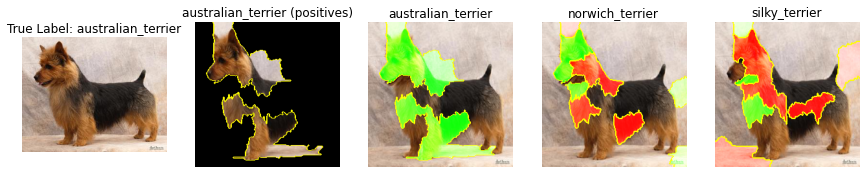

  0%|          | 0/1000 [00:00<?, ?it/s]

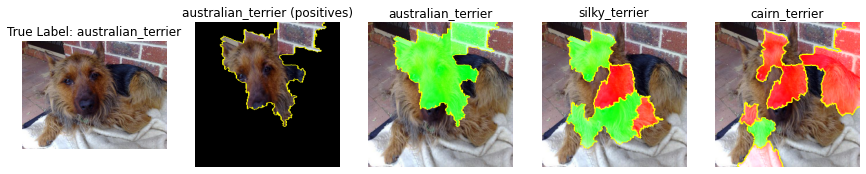

  0%|          | 0/1000 [00:00<?, ?it/s]

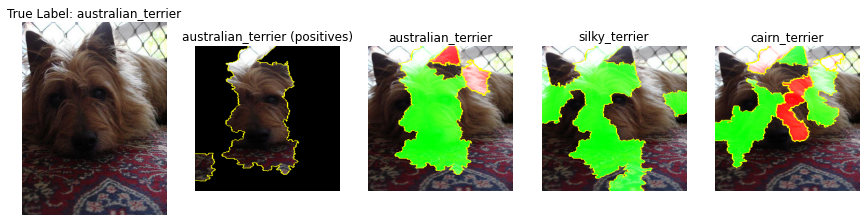

  0%|          | 0/1000 [00:00<?, ?it/s]

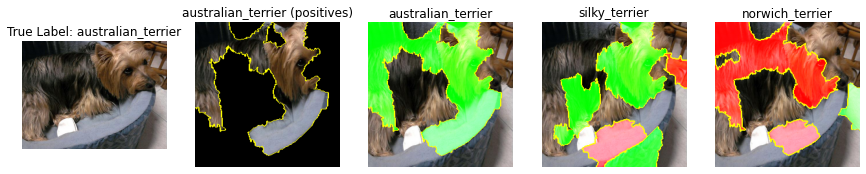

  0%|          | 0/1000 [00:00<?, ?it/s]

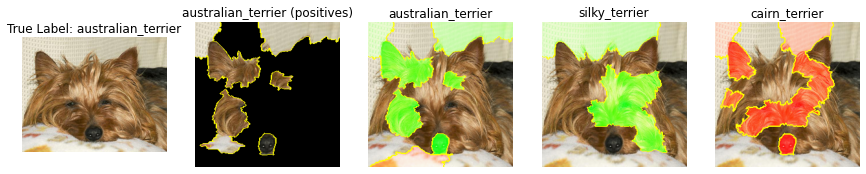

  0%|          | 0/1000 [00:00<?, ?it/s]

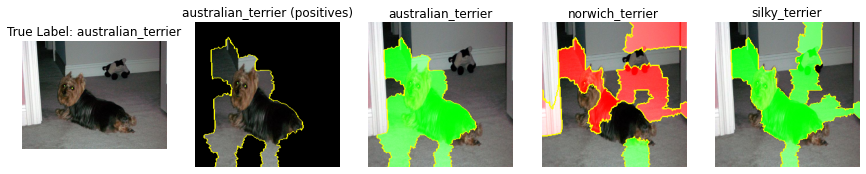

  0%|          | 0/1000 [00:00<?, ?it/s]

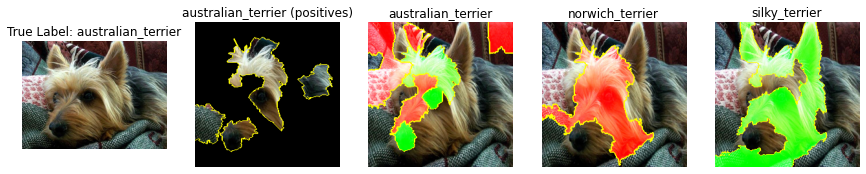

  0%|          | 0/1000 [00:00<?, ?it/s]

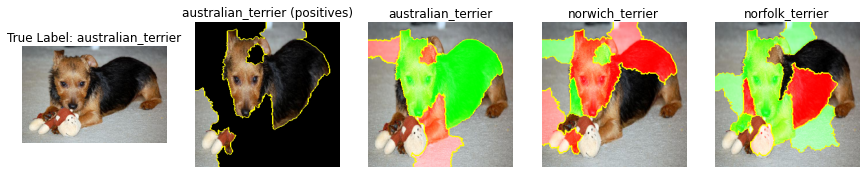

  0%|          | 0/1000 [00:00<?, ?it/s]

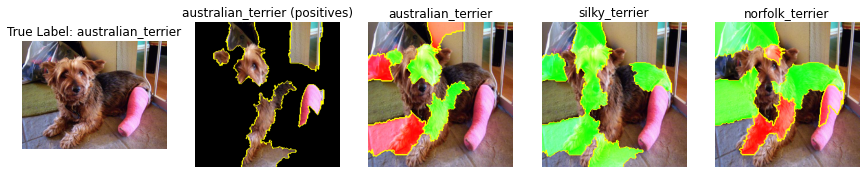

  0%|          | 0/1000 [00:00<?, ?it/s]

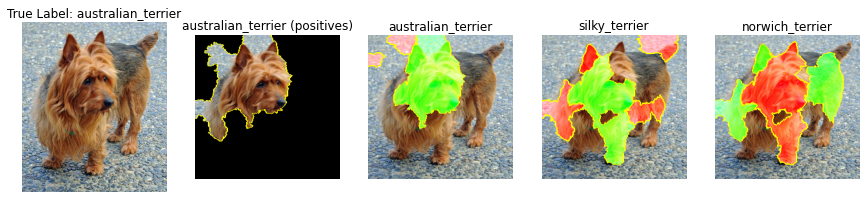

In [ ]:
# correctly predicted results for australian terrier with top 3 labels
for i in range(10):
  path = australian_corr[i]
  predict(path)

#### Incorrectly predicted australian terrier samples

  0%|          | 0/1000 [00:00<?, ?it/s]

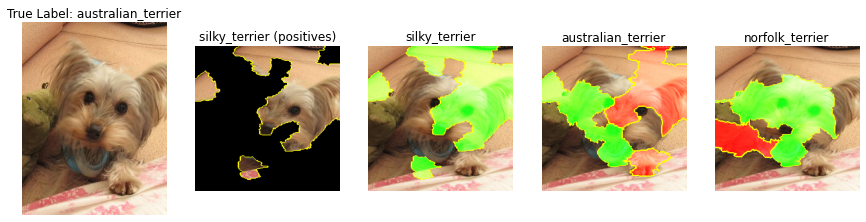

  0%|          | 0/1000 [00:00<?, ?it/s]

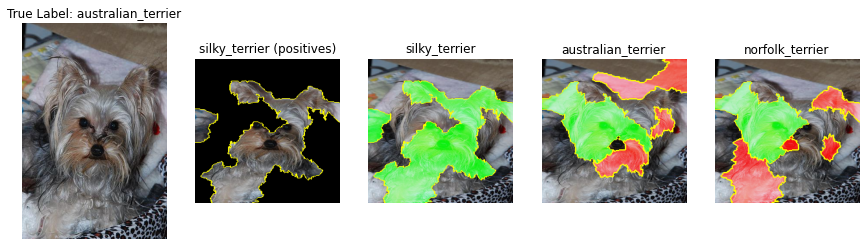

  0%|          | 0/1000 [00:00<?, ?it/s]

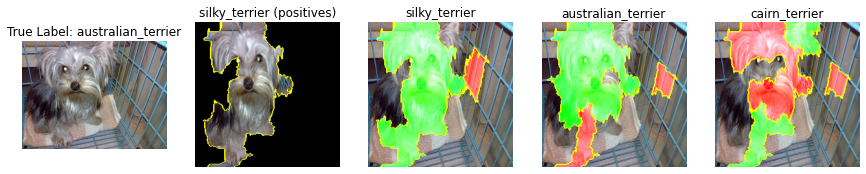

  0%|          | 0/1000 [00:00<?, ?it/s]

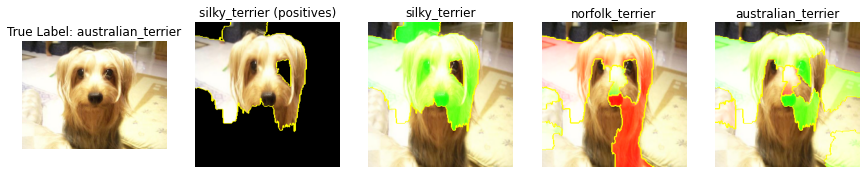

  0%|          | 0/1000 [00:00<?, ?it/s]

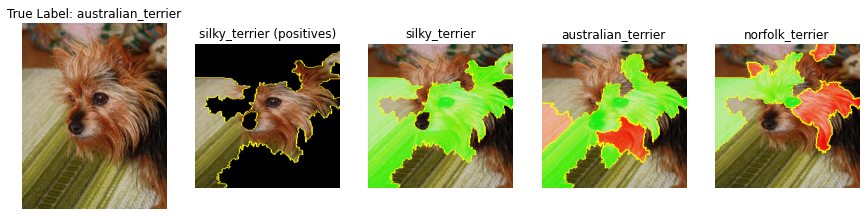

  0%|          | 0/1000 [00:00<?, ?it/s]

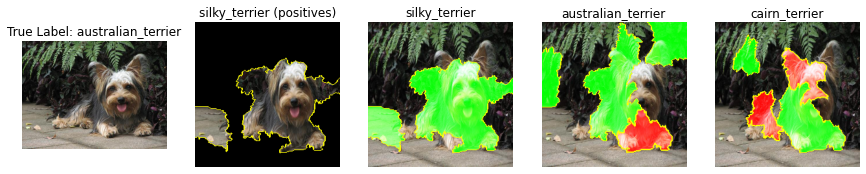

  0%|          | 0/1000 [00:00<?, ?it/s]

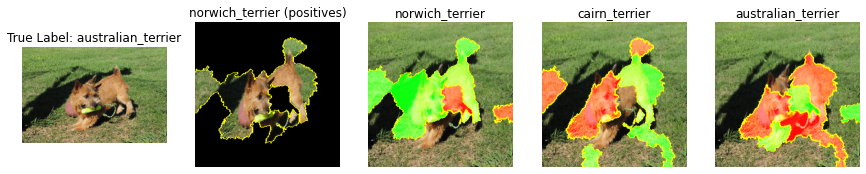

  0%|          | 0/1000 [00:00<?, ?it/s]

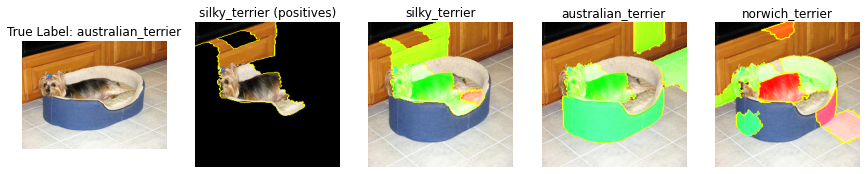

  0%|          | 0/1000 [00:00<?, ?it/s]

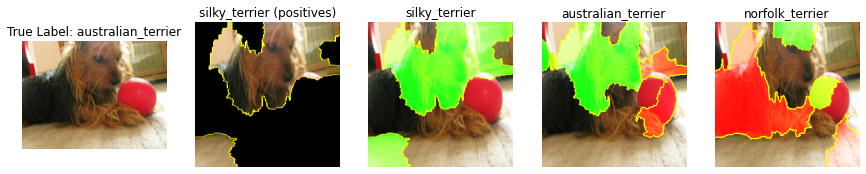

  0%|          | 0/1000 [00:00<?, ?it/s]

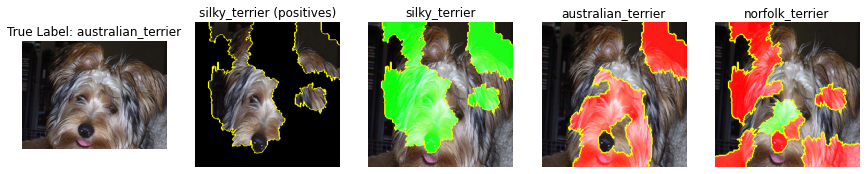

In [ ]:
# incorrectly predicted results for australian terrier with top 3 labels
for i in range(10):
  path = australian_incorr[i]
  predict(path)

### Explaining predictions for Cairn Terrier


#### Correctly predicted cairn terrier samples

  0%|          | 0/1000 [00:00<?, ?it/s]

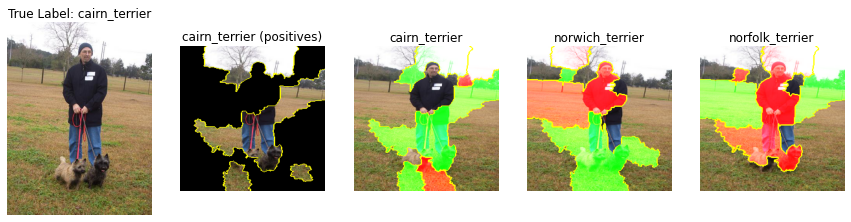

  0%|          | 0/1000 [00:00<?, ?it/s]

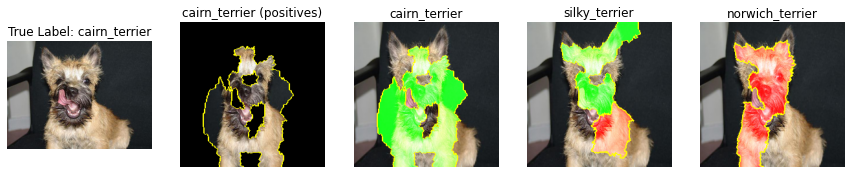

  0%|          | 0/1000 [00:00<?, ?it/s]

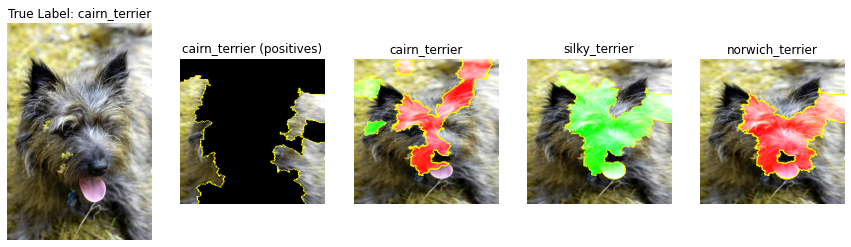

  0%|          | 0/1000 [00:00<?, ?it/s]

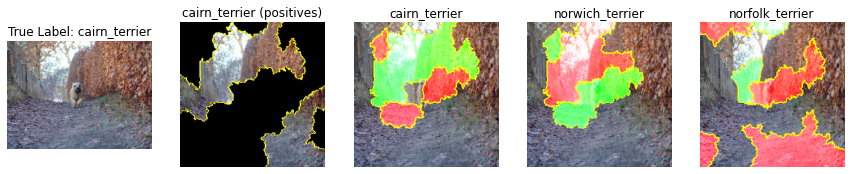

  0%|          | 0/1000 [00:00<?, ?it/s]

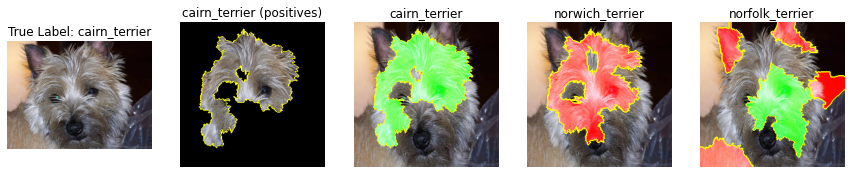

  0%|          | 0/1000 [00:00<?, ?it/s]

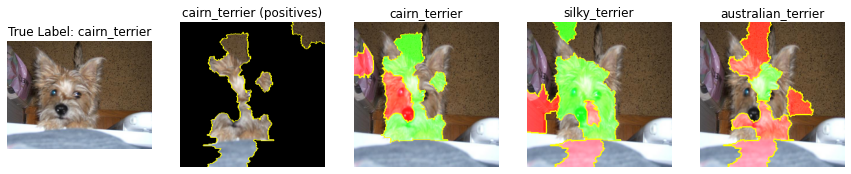

  0%|          | 0/1000 [00:00<?, ?it/s]

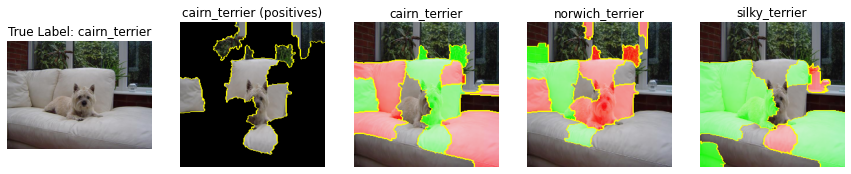

  0%|          | 0/1000 [00:00<?, ?it/s]

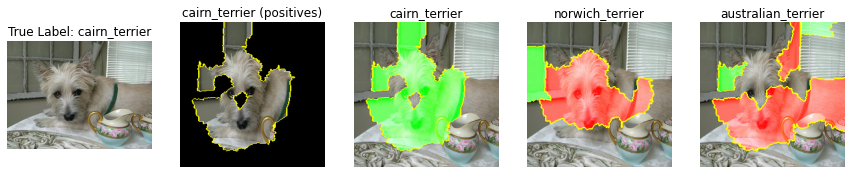

  0%|          | 0/1000 [00:00<?, ?it/s]

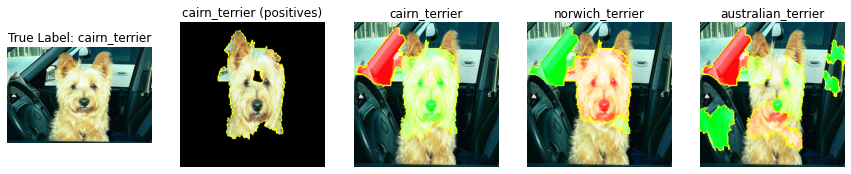

  0%|          | 0/1000 [00:00<?, ?it/s]

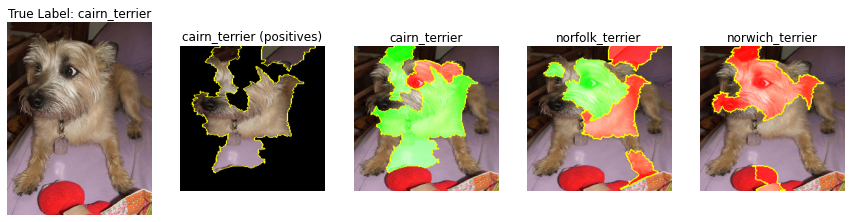

In [ ]:
# correctly predicted results for cairn terrier with top 3 labels
for i in range(10):
  path = cairn_corr[i]
  predict(path)

#### Incorrectly predicted cairn terrier samples

  0%|          | 0/1000 [00:00<?, ?it/s]

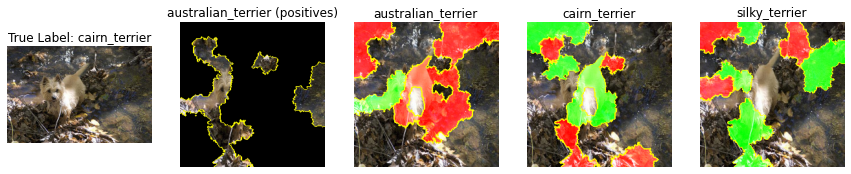

  0%|          | 0/1000 [00:00<?, ?it/s]

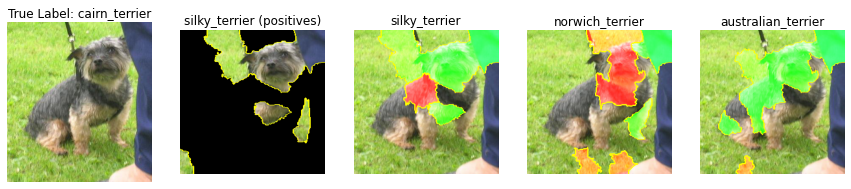

  0%|          | 0/1000 [00:00<?, ?it/s]

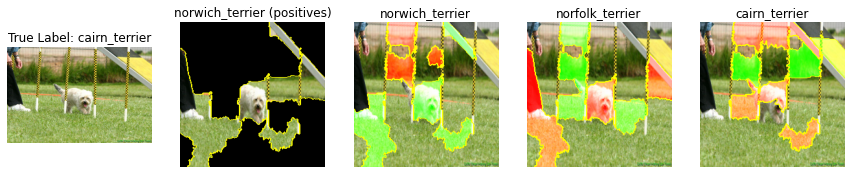

In [ ]:
# incorrectly predicted results for cairn terrier with top 3 labels
for i in range(len(cairn_incorr)):
  path = cairn_incorr[i]
  predict(path)

### Explaining predictions for Norfolk Terrier


#### Correctly predicted norfolk terrier samples

  0%|          | 0/1000 [00:00<?, ?it/s]

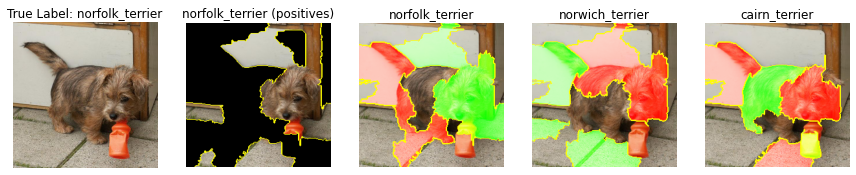

  0%|          | 0/1000 [00:00<?, ?it/s]

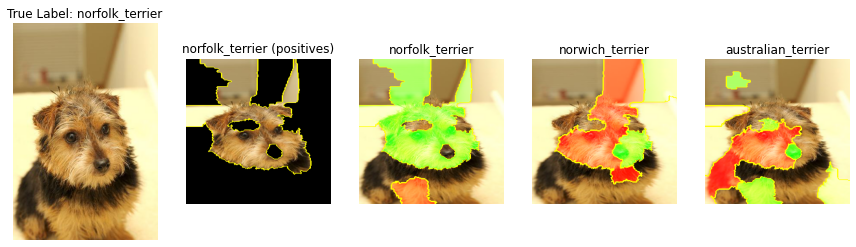

  0%|          | 0/1000 [00:00<?, ?it/s]

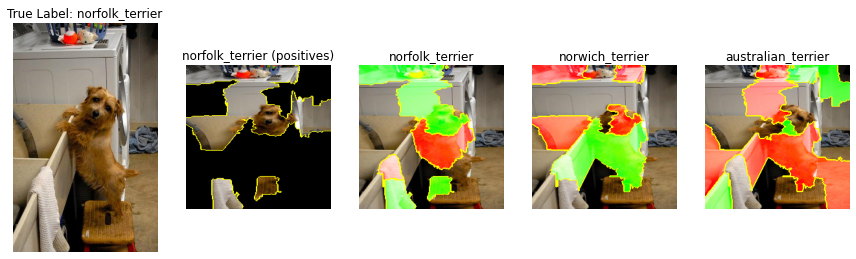

  0%|          | 0/1000 [00:00<?, ?it/s]

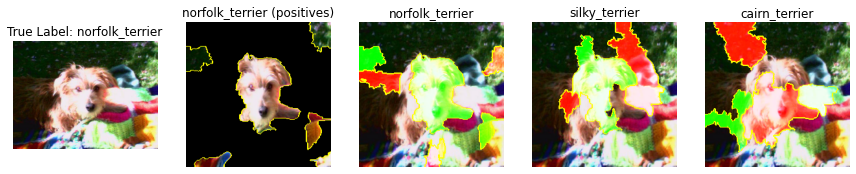

  0%|          | 0/1000 [00:00<?, ?it/s]

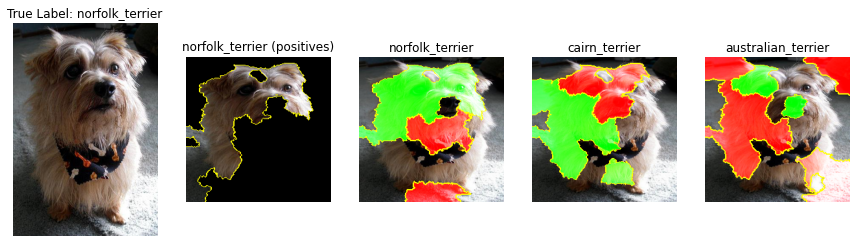

  0%|          | 0/1000 [00:00<?, ?it/s]

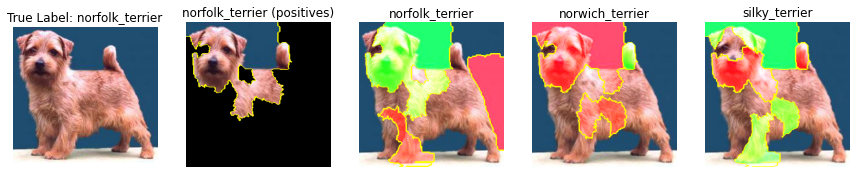

  0%|          | 0/1000 [00:00<?, ?it/s]

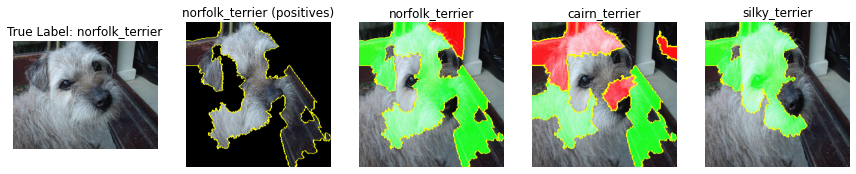

  0%|          | 0/1000 [00:00<?, ?it/s]

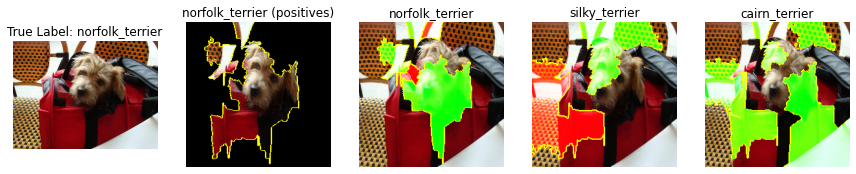

  0%|          | 0/1000 [00:00<?, ?it/s]

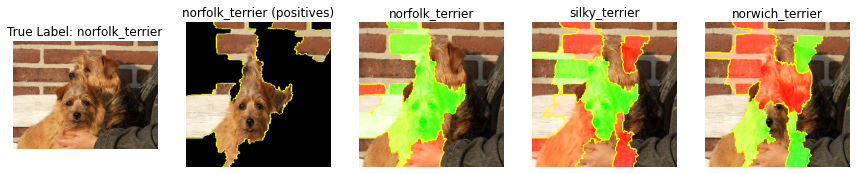

  0%|          | 0/1000 [00:00<?, ?it/s]

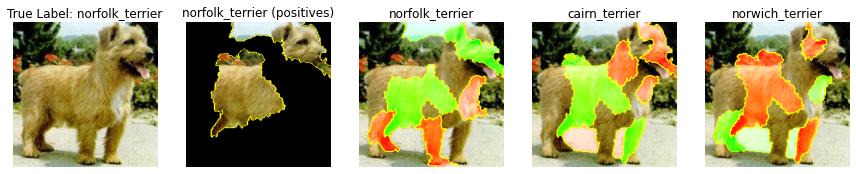

In [ ]:
# correctly predicted results for norfolk terrier with top 3 labels
for i in range(10):
  path = norfolk_corr[i]
  predict(path)

#### Incorrectly predicted norfolk terrier samples

  0%|          | 0/1000 [00:00<?, ?it/s]

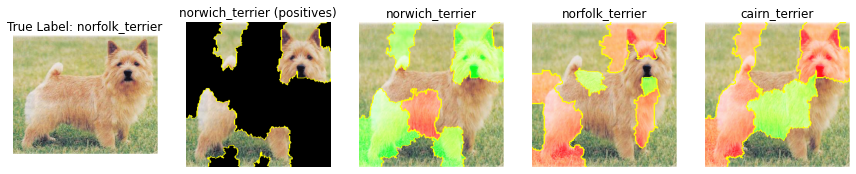

  0%|          | 0/1000 [00:00<?, ?it/s]

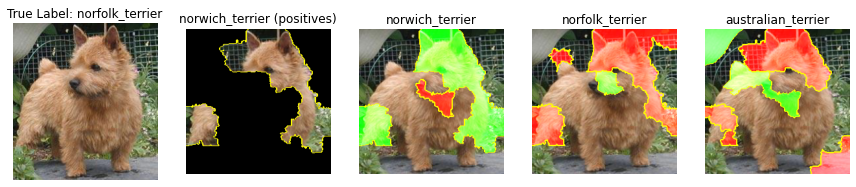

  0%|          | 0/1000 [00:00<?, ?it/s]

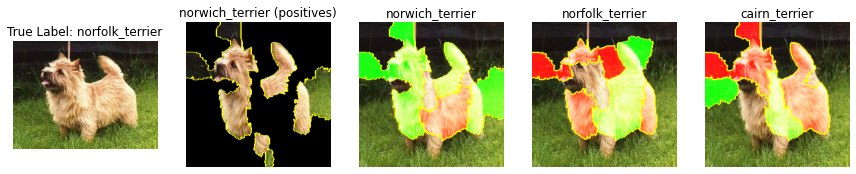

  0%|          | 0/1000 [00:00<?, ?it/s]

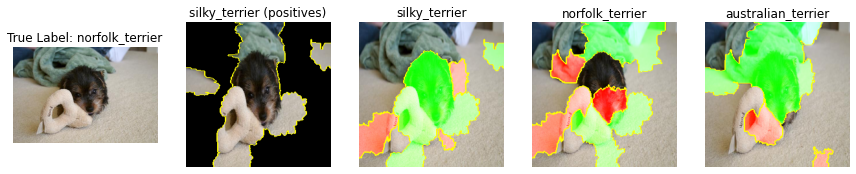

  0%|          | 0/1000 [00:00<?, ?it/s]

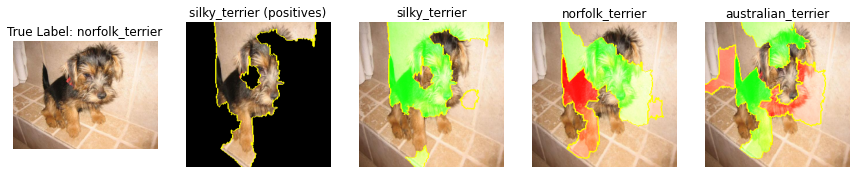

  0%|          | 0/1000 [00:00<?, ?it/s]

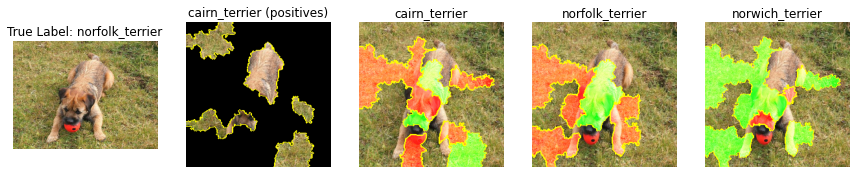

  0%|          | 0/1000 [00:00<?, ?it/s]

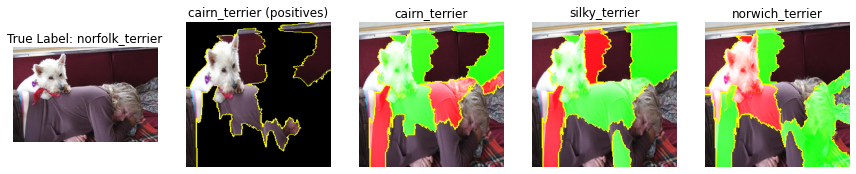

In [ ]:
# incorrectly predicted results for norfolk terrier with top 3 labels
for i in range(len(norfolk_incorr)):
  path = norfolk_incorr[i]
  predict(path)

### Explaining predictions for Norwich Terrier


#### Correctly predicted norwich terrier samples

  0%|          | 0/1000 [00:00<?, ?it/s]

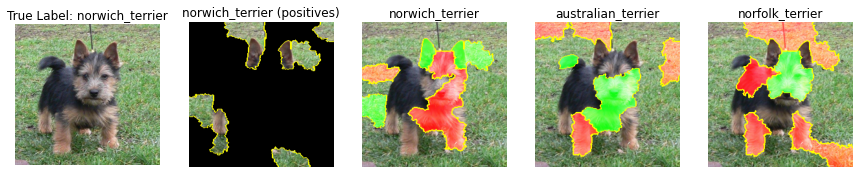

  0%|          | 0/1000 [00:00<?, ?it/s]

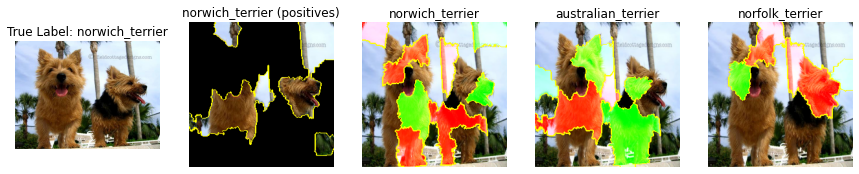

  0%|          | 0/1000 [00:00<?, ?it/s]

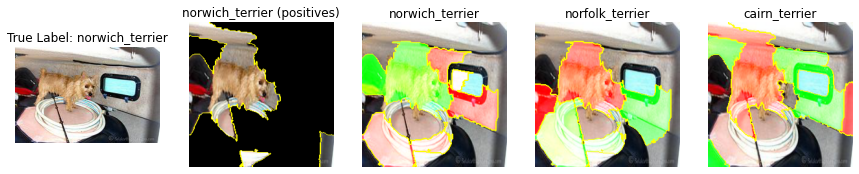

  0%|          | 0/1000 [00:00<?, ?it/s]

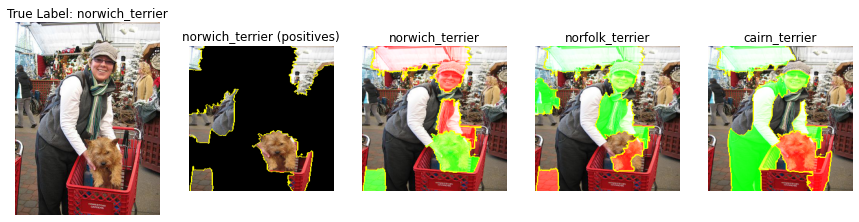

  0%|          | 0/1000 [00:00<?, ?it/s]

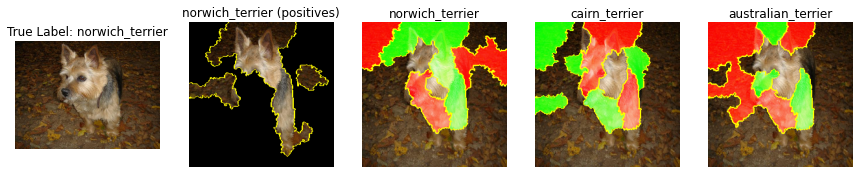

  0%|          | 0/1000 [00:00<?, ?it/s]

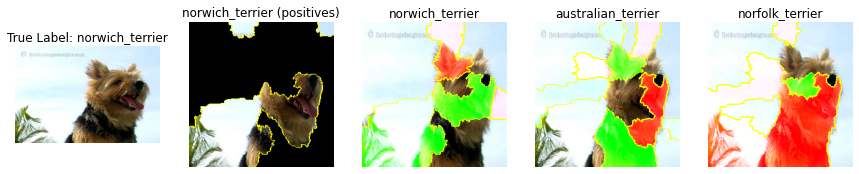

  0%|          | 0/1000 [00:00<?, ?it/s]

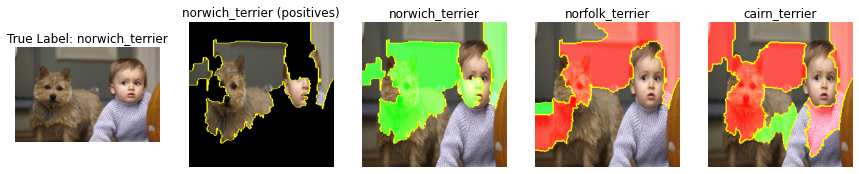

  0%|          | 0/1000 [00:00<?, ?it/s]

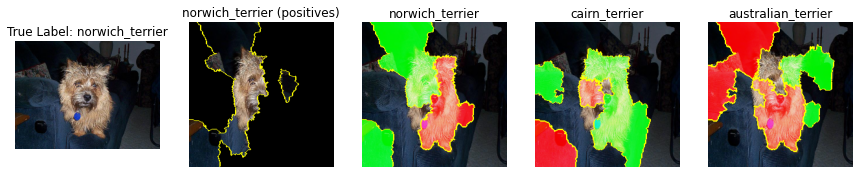

  0%|          | 0/1000 [00:00<?, ?it/s]

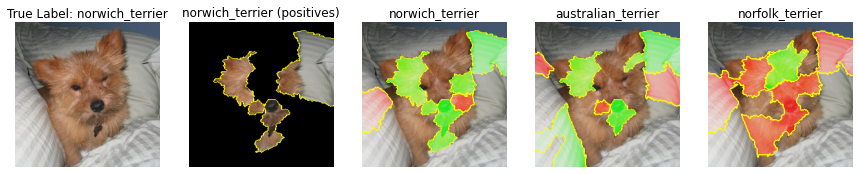

  0%|          | 0/1000 [00:00<?, ?it/s]

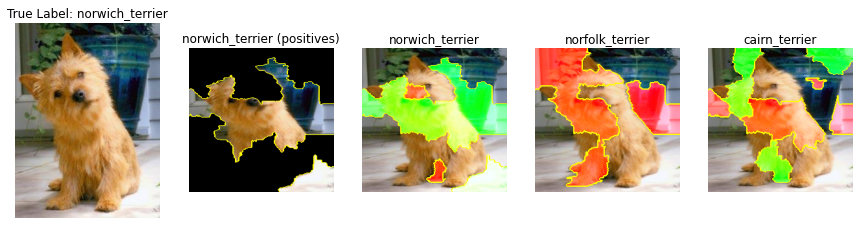

In [ ]:
# correctly predicted results for norwich terrier with top 3 labels
for i in range(10):
  path = norwich_corr[i]
  predict(path)

#### Incorrectly predicted norwich terrier samples

  0%|          | 0/1000 [00:00<?, ?it/s]

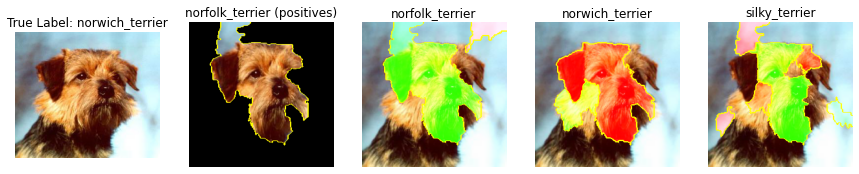

  0%|          | 0/1000 [00:00<?, ?it/s]

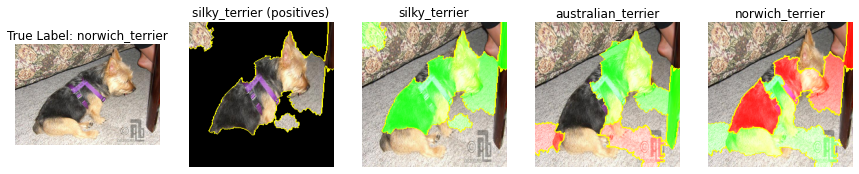

  0%|          | 0/1000 [00:00<?, ?it/s]

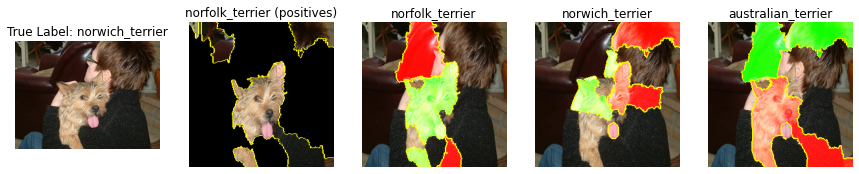

  0%|          | 0/1000 [00:00<?, ?it/s]

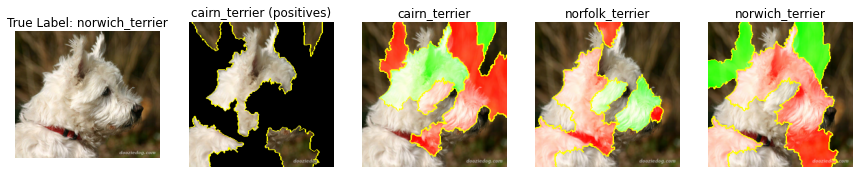

  0%|          | 0/1000 [00:00<?, ?it/s]

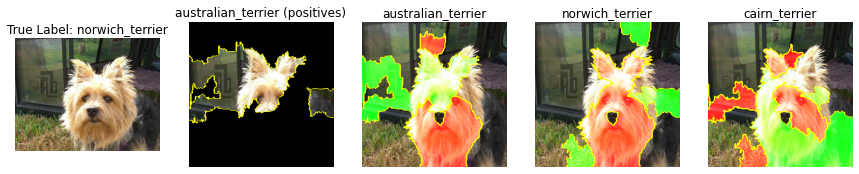

  0%|          | 0/1000 [00:00<?, ?it/s]

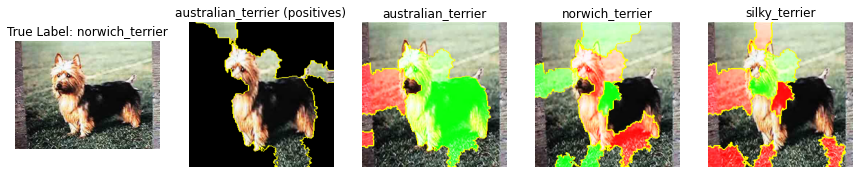

  0%|          | 0/1000 [00:00<?, ?it/s]

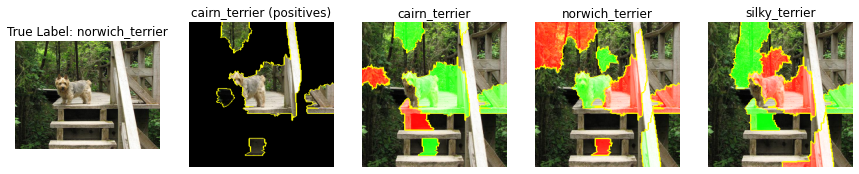

  0%|          | 0/1000 [00:00<?, ?it/s]

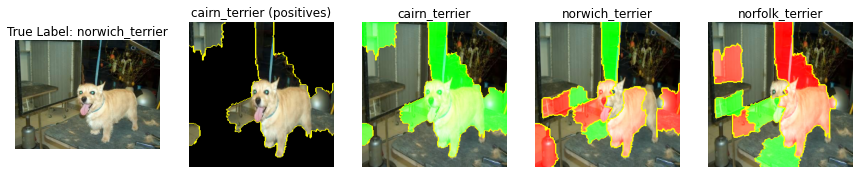

  0%|          | 0/1000 [00:00<?, ?it/s]

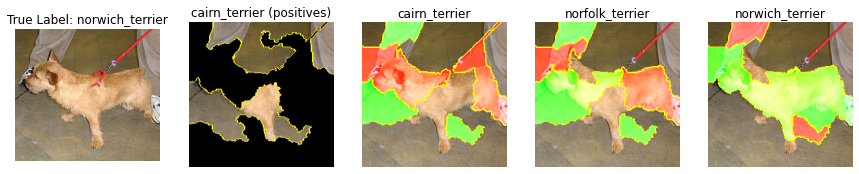

  0%|          | 0/1000 [00:00<?, ?it/s]

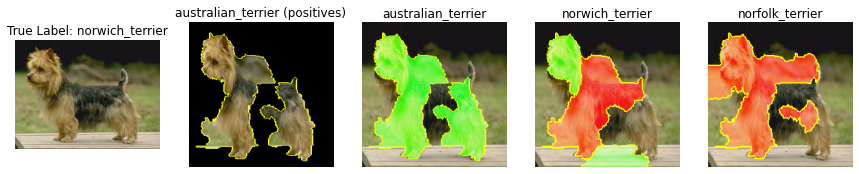

In [ ]:
# correctly predicted results for norwich terrier with top 3 labels
for i in range(10):
  path = norwich_incorr[i]
  predict(path)

### Explaining predictions for Silky Terrier


#### Correctly predicted silky terrier samples

  0%|          | 0/1000 [00:00<?, ?it/s]

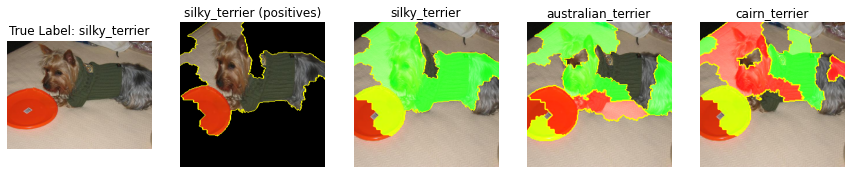

  0%|          | 0/1000 [00:00<?, ?it/s]

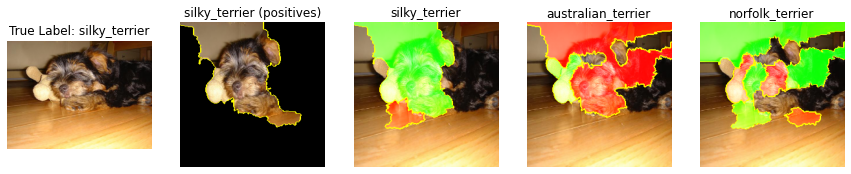

  0%|          | 0/1000 [00:00<?, ?it/s]

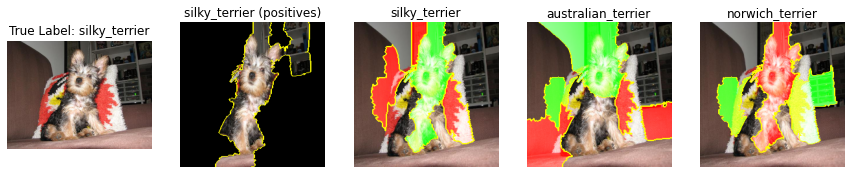

  0%|          | 0/1000 [00:00<?, ?it/s]

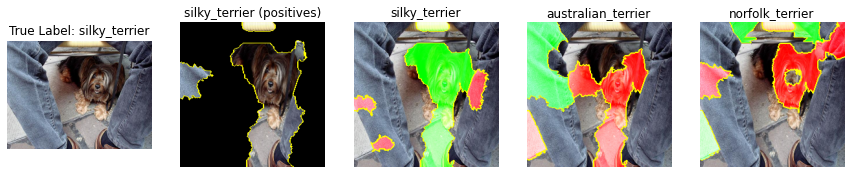

  0%|          | 0/1000 [00:00<?, ?it/s]

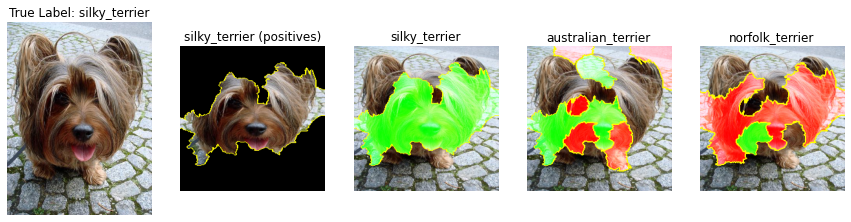

  0%|          | 0/1000 [00:00<?, ?it/s]

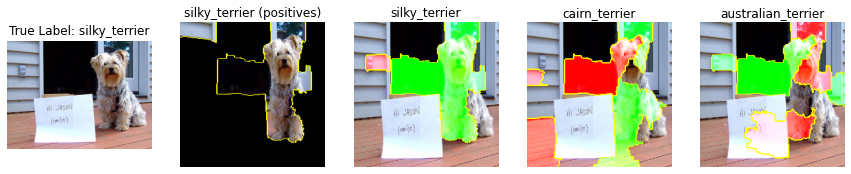

  0%|          | 0/1000 [00:00<?, ?it/s]

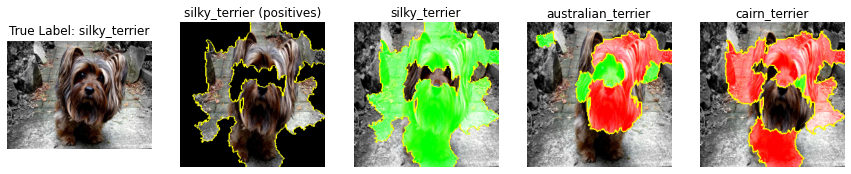

  0%|          | 0/1000 [00:00<?, ?it/s]

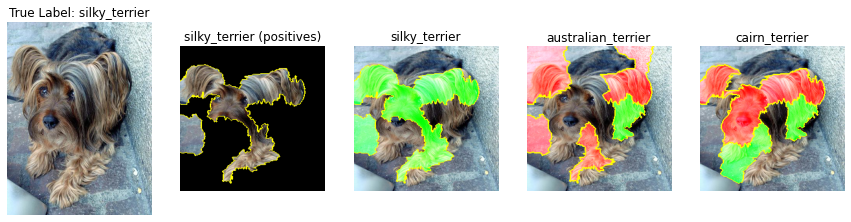

  0%|          | 0/1000 [00:00<?, ?it/s]

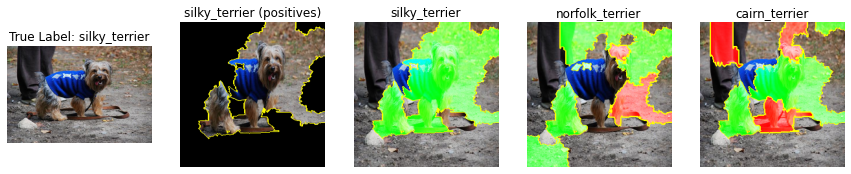

  0%|          | 0/1000 [00:00<?, ?it/s]

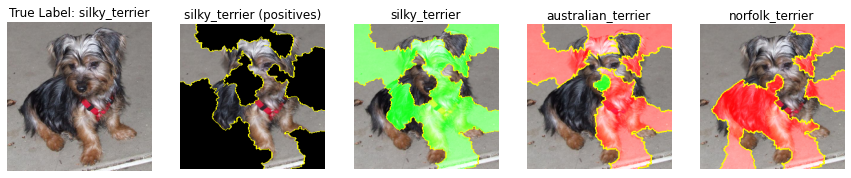

In [ ]:
# correctly predicted results for silky terrier with top 3 labels
for i in range(10):
  path = silky_corr[i]
  predict(path)

#### Incorrectly predicted silky terrier samples

  0%|          | 0/1000 [00:00<?, ?it/s]

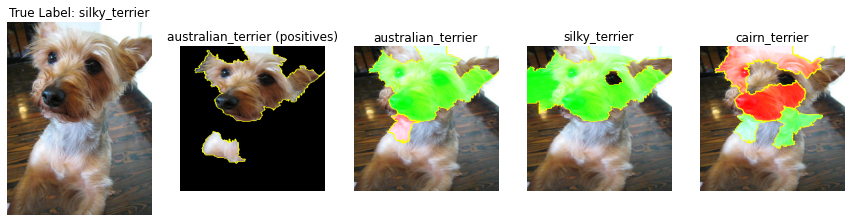

  0%|          | 0/1000 [00:00<?, ?it/s]

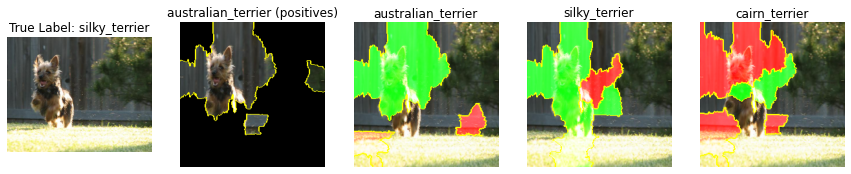

  0%|          | 0/1000 [00:00<?, ?it/s]

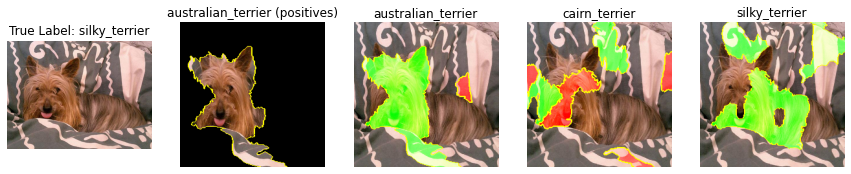

  0%|          | 0/1000 [00:00<?, ?it/s]

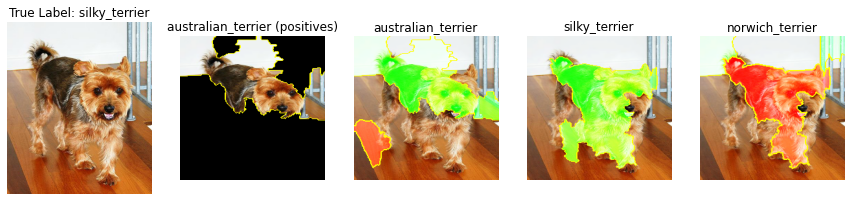

  0%|          | 0/1000 [00:00<?, ?it/s]

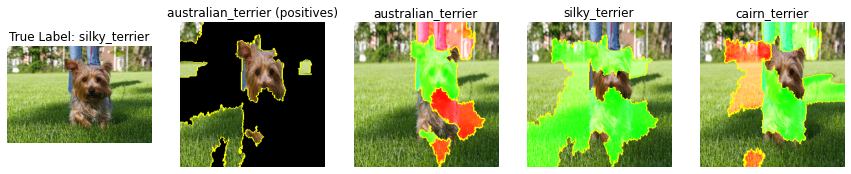

  0%|          | 0/1000 [00:00<?, ?it/s]

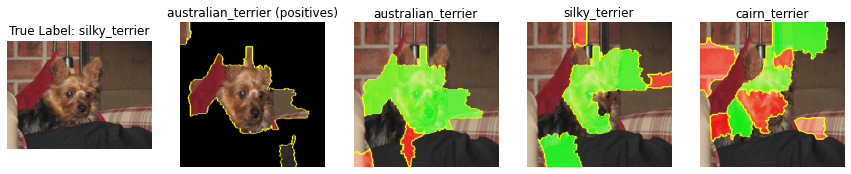

  0%|          | 0/1000 [00:00<?, ?it/s]

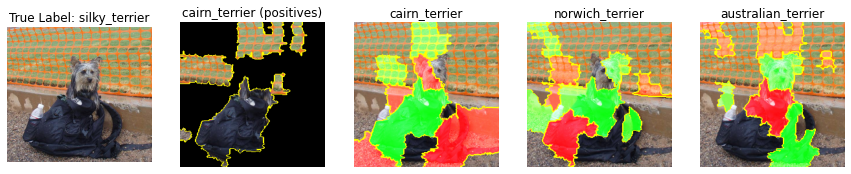

  0%|          | 0/1000 [00:00<?, ?it/s]

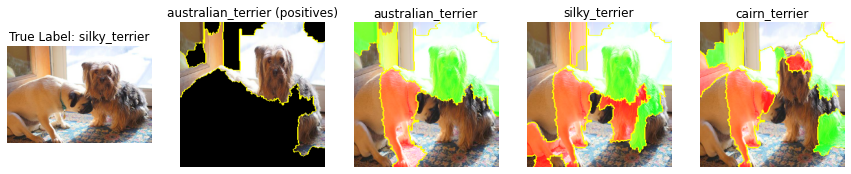

  0%|          | 0/1000 [00:00<?, ?it/s]

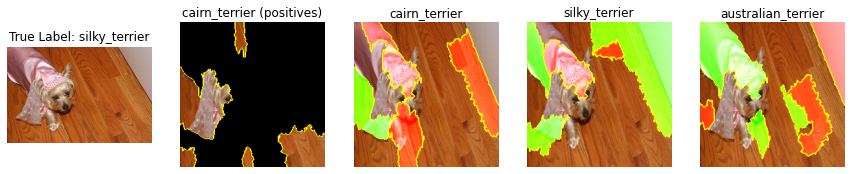

In [ ]:
# correctly predicted results for silky terrier with top 3 labels
for i in range(len(silky_incorr)):
  path = silky_incorr[i]
  predict(path)